# Kaggle Cassava Leaf Disease Image Classification Competition

## TODO add a blurb

### Top-level imports

In [1]:
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
from PIL import Image

from pathlib import Path
import os
from tqdm import tqdm
import datetime

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

## EDA

### Set up extended training set, removing duplicates

In [4]:
old_data_path = Path(os.getcwd()) / 'cassava-disease' / 'train'

In [10]:
old_data_path

WindowsPath('C:/Users/dan/gh/projects/kaggle-cassava/cassava-disease/train')

In [6]:
# path to data
data_path = Path(os.getcwd()) / "cassava-leaf-disease-classification"

In [5]:
# rearrange data to allow data loading
for label in range(4):
    abbrev = disease_names[str(label)].split("(")[1][:-1]
    print(abbrev)
    os.mkdir(data_path / "train_images" / abbrev)
    
os.mkdir(data_path / "train_images" / "Healthy")

NameError: name 'disease_names' is not defined

In [ ]:
## DO NOT RUN AGAIN

for index, row in df_train.iterrows():
    image_name = row['image_id']
    label = row['label']
    if label != 4:
        abbrev = disease_names[str(label)].split("(")[1][:-1]
    else:
        abbrev = "Healthy"
        
    os.replace(data_path / 'train_images' / image_name, data_path / 'train_images' / abbrev / image_name)

In [29]:
# list of duplicate images taken from https://www.kaggle.com/zzy990106/duplicate-images-in-two-competitions
duplicates = eval(open(Path(os.getcwd()) / 'duplicates.txt', 'r').read())

In [31]:
duplicates_old = [x[1] for x in duplicates]

In [33]:
duplicates_old

['train-cbsd-614.jpg',
 'train-cgm-677.jpg',
 'train-cbsd-1272.jpg',
 'train-cmd-1049.jpg',
 'train-cgm-416.jpg',
 'train-cgm-456.jpg',
 'train-cbsd-355.jpg',
 'train-cmd-10.jpg',
 'train-cmd-1009.jpg',
 'train-cmd-809.jpg',
 'train-cbsd-1248.jpg',
 'train-cbsd-50.jpg',
 'train-cmd-2099.jpg',
 'train-cmd-1643.jpg',
 'train-cmd-207.jpg',
 'train-cmd-2601.jpg',
 'train-cgm-714.jpg',
 'train-cgm-482.jpg',
 'train-cmd-1456.jpg',
 'train-cmd-646.jpg',
 'train-cbb-345.jpg',
 'train-cmd-2371.jpg',
 'train-cmd-986.jpg',
 'train-cmd-2630.jpg',
 'train-cmd-2222.jpg',
 'train-cgm-303.jpg',
 'train-cgm-438.jpg',
 'train-cmd-42.jpg',
 'train-cmd-528.jpg',
 'train-cgm-515.jpg',
 'train-cbsd-1213.jpg',
 'train-cmd-411.jpg',
 'train-cmd-363.jpg',
 'train-cmd-1558.jpg',
 'train-cmd-1698.jpg',
 'train-cgm-426.jpg',
 'train-cmd-1278.jpg',
 'train-cbb-261.jpg',
 'train-cmd-1970.jpg',
 'train-cbsd-293.jpg',
 'train-cbsd-446.jpg',
 'train-cmd-2535.jpg',
 'train-cmd-2507.jpg',
 'train-cbsd-1203.jpg',
 'train

In [34]:
# create extended dataset without duplicates

start_time = datetime.datetime.now()

# we only compare images to others with same label to save time
for old_folder in tqdm(os.scandir(old_data_path)):
    
    # iterate through images in the old dataset
    old_path = old_data_path / old_folder.name
    for img in tqdm(os.scandir(old_path)):
        
        # if no duplicate was found, move it into the training directory
        if not img.name in duplicates_old:
            label = img.name.split("-")[1]
            if label == "healthy":
                os.replace(old_path / img.name, data_path / 'train_images' / "Healthy" / img.name)
            else:
                os.replace(old_path / img.name, data_path / 'train_images' / label.upper() / img.name)
            
print(datetime.datetime.now()-start_time)
        

0it [00:00, ?it/s]
0it [00:00, ?it/s]
457it [00:00, 2672.57it/s]
1it [00:00,  5.71it/s]
0it [00:00, ?it/s]
270it [00:00, 2673.32it/s]
573it [00:00, 2865.50it/s]
860it [00:00, 2791.46it/s]
1140it [00:00, 2680.63it/s]
1443it [00:00, 2667.28it/s]
2it [00:00,  2.55it/s]
0it [00:00, ?it/s]
311it [00:00, 3109.96it/s]
773it [00:00, 3092.02it/s]
3it [00:00,  3.05it/s]
0it [00:00, ?it/s]
199it [00:00, 1970.32it/s]
397it [00:00, 1759.52it/s]
615it [00:00, 1939.06it/s]
845it [00:00, 2067.99it/s]
1071it [00:00, 2135.25it/s]
1305it [00:00, 2203.54it/s]
1596it [00:00, 2423.72it/s]
1891it [00:00, 2589.41it/s]
2197it [00:00, 2735.40it/s]
2658it [00:01, 2443.02it/s]
4it [00:02,  1.59it/s]
0it [00:00, ?it/s]
316it [00:00, 2358.23it/s]
5it [00:02,  2.27it/s]

0:00:02.202992


### Set up dataframe with training data

In [7]:
# dataframe matching training images to labels
df_train = pd.read_csv(data_path/'train.csv')
print(df_train.head())

         image_id  label
0  1000015157.jpg      0
1  1000201771.jpg      3
2   100042118.jpg      1
3  1000723321.jpg      1
4  1000812911.jpg      3


In [8]:
# Match labels to corresponding disease
disease_names = open(data_path /'label_num_to_disease_map.json')
disease_names = json.load(disease_names)
df_train['disease'] = df_train['label'].apply(lambda x: disease_names[str(x)])

df_train.head()

,image_id,label,disease
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)


In [12]:
disease_names

{'0': 'Cassava Bacterial Blight (CBB)',
 '1': 'Cassava Brown Streak Disease (CBSD)',
 '2': 'Cassava Green Mottle (CGM)',
 '3': 'Cassava Mosaic Disease (CMD)',
 '4': 'Healthy'}

In [11]:
# Check the distribution of labels
a = df_train['disease'].value_counts()


2577

In [10]:
disease_names

{'0': 'Cassava Bacterial Blight (CBB)',
 '1': 'Cassava Brown Streak Disease (CBSD)',
 '2': 'Cassava Green Mottle (CGM)',
 '3': 'Cassava Mosaic Disease (CMD)',
 '4': 'Healthy'}

In [ ]:
class_sample_count = [1087, 2189, 2386, 13158, 2577] # dataset has 10 class-1 samples, 1 class-2 samples, etc.
weights = 1 / torch.Tensor(class_sample_count)
weights = weights.double()
sampler = torch.utils.data.sampler.WeightedRandomSampler(weights, batch_size)
trainloader = torch.utils.data.DataLoader(trainDataset, batch_size = batch_size, sampler = sampler)

In [50]:
# Check out some images from each class, random sample
ex_images = []
for label in range(5):
    ex_images.append(df_train['image_id'][df_train['label']==label].sample(5))


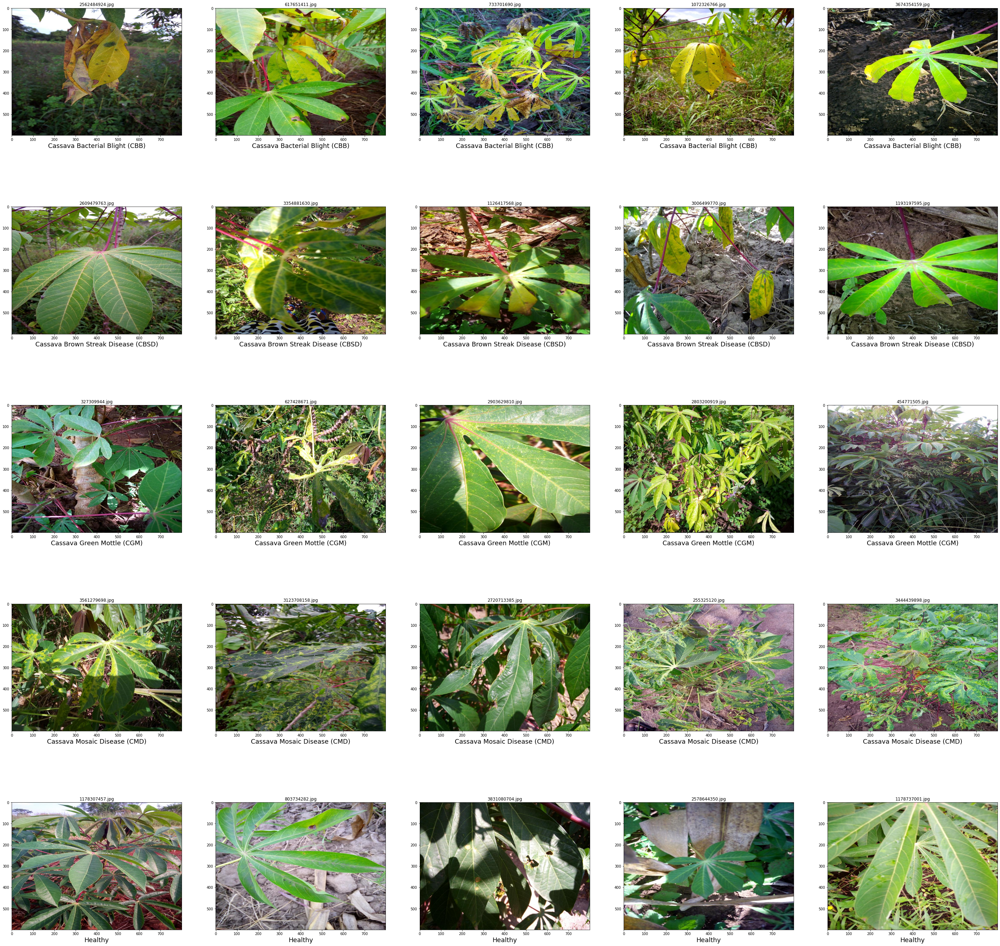

In [51]:
# Plot the sampled images to take a look
fig = plt.figure(figsize=(50, 50))

counter = 1
for label in range(5):
    image_df = ex_images[label]
    for _, image_id in image_df.items():
        if label != 4:
            abbrev = disease_names[str(label)].split("(")[1][:-1]
        else:
            abbrev = "Healthy"
        image = Image.open(data_path / "train_images" / abbrev / image_id)
        np_img = np.array(image)
        ax = fig.add_subplot(5, 5, counter)
        ax.imshow(np_img)
        ax.set_xlabel(disease_names[str(label)], fontsize=18)
        ax.title.set_text(image_id)
        counter += 1
        

## A simple Resnet baseline

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import time
import copy

In [20]:
# grab pretrained resnext50 model (a pretty high performing image classification model)
model = torch.hub.load('pytorch/vision:v0.6.0', 'resnext50_32x4d', pretrained=True)

Using cache found in C:\Users\dan/.cache\torch\hub\pytorch_vision_v0.6.0


In [21]:
# A bit of hyperparameter setup

# resize the images to be square
img_size = 384

# number of classes in the dataset
num_classes = 5

# batch size for training 
batch_size = 8

# number of epochs to train for
num_epochs = 10

# set GPU/CPU 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [44]:
from experimenter import Experimenter

In [23]:
from data_utils import DatasetConstructor, reshape_model

In [24]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

In [25]:
# lets add some transforms, at least to resize
transform = {
    'train_transform': A.Compose(
    [A.Resize(img_size, img_size),
    ToTensorV2()]),
    'eval_transform': A.Compose(
    [A.Resize(img_size, img_size),
    ToTensorV2()])
}

In [26]:
constructor = DatasetConstructor(
    data_path / "train_images", 
    batch_size, 
    k=5, 
    transform=transform
)

In [27]:
# reshape model to have correct final layer
model = reshape_model(model, num_classes)

In [41]:
# send the model to GPU
model = model.to(device)

# create an optimiser (Adam with no hyperparameter tweaks for baseline)
optimiser = optim.Adam(model.parameters())

In [29]:
device

device(type='cuda', index=0)

In [30]:
optimiser_config = {
    'lr': 2e-3
}
lr_scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts
lr_config = {
    'T_0': 10,
    'T_mult': 1,
    'eta_min': 1e-6,
    'last_epoch': -1
}
loss_function = nn.CrossEntropyLoss()

In [31]:
loss_function = nn.CrossEntropyLoss()

In [45]:
experiment = Experimenter(
    model, 
    "resnext50_mish_ranger_1", 
    device, 
    loss_function, 
    optimiser, 
    optimiser_config, 
    lr_scheduler, 
    lr_config, 
    constructor, 
    num_epochs, 
    num_classes, 
    12, 
    patience=5, 
    tta=10
)

In [46]:
experiment.train()

cuda:0


ModuleAttributeError: 'ResNet' object has no attribute 'device'

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 2            |        cudaMalloc retries: 2         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |    4407 MB |    4407 MB |    4656 MB |  254568 KB |\n|       from large pool |    4360 MB |    4360 MB |    4601 MB |  246888 KB |\n|       from small pool |      47 MB |      47 MB |      55 MB |    7679 KB |\n|---------------------------------------------------------------------------|\n| Active memory         |    4407 MB |    4407 MB |    4656 MB |  254568 KB |\n|       from large pool |    4360 MB |    4360 MB |

## SIREN Network

In [41]:
from models import siren, initialise_weights

In [42]:
model = siren()

In [43]:
model.load_state_dict(model_dict)

<All keys matched successfully>

In [44]:
reshape_model(model, num_classes)

SirenResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): SirenActivation()
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): SirenBottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): SirenActivation()
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel

Conv2d
BatchNorm2d
SirenActivation
MaxPool2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
SirenActivation
Conv2d
BatchNorm2d
Sequential
SirenBottleneck
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
SirenActivation
SirenBottleneck
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
SirenActivation
SirenBottleneck
Sequential
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
SirenActivation
Conv2d
BatchNorm2d
Sequential
SirenBottleneck
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
SirenActivation
SirenBottleneck
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
SirenActivation
SirenBottleneck
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
SirenActivation
SirenBottleneck
Sequential
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
SirenActivation
Conv2d
BatchNorm2d
Sequential
SirenBottleneck
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
SirenActivation
SirenBottleneck
Conv2d
BatchNorm2d
Conv2d
BatchNorm2d
Conv

In [45]:
# send the model to GPU
model = model.to(device)

# create an optimiser (Adam with no hyperparameter tweaks for baseline)
optimiser = optim.Adam(model.parameters())

In [46]:
# batch size for training 
batch_size = 4
train_data, val_data = construct_datasets(data_path / 'train_images', batch_size, transform = transform)

In [47]:
lr_scheduler = optim.lr_scheduler.CosineAnnealingLR(optimiser, len(train_data))

In [48]:
# initiliase the experiment
loss_function = nn.CrossEntropyLoss()
experiment = Experimenter(model, device, loss_function, optimiser, lr_scheduler, train_data, val_data, num_epochs)

In [49]:
trained_model, statistics = experiment.train()

  0%|                                                                                      | 0/3745 [00:00<?, ?batch/s]

Epoch 1/5



100%|███████████████████████████████████████████████████████████████| 3745/3745 [17:17<00:00,  3.61batch/s, loss=0.903]


Training loss - Epoch 1/5: 1.1191045340711987
Training accuracy - Epoch 1/5: 0.6166789076584096


  0%|                                                                                      | 0/3745 [00:00<?, ?batch/s]

Validation loss - Epoch 1/5: 2.18749388647452
Validation accuracy - Epoch 1/5: 0.11838152259588242

Epoch 2/5



100%|████████████████████████████████████████████████████████████████| 3745/3745 [17:05<00:00,  3.65batch/s, loss=2.05]


Training loss - Epoch 2/5: 0.9757890392286624
Training accuracy - Epoch 2/5: 0.6436536021900247


  0%|                                                                                      | 0/3745 [00:00<?, ?batch/s]

Validation loss - Epoch 2/5: 1.209360335497542
Validation accuracy - Epoch 2/5: 0.5038392543792725

Epoch 3/5



100%|████████████████████████████████████████████████████████████████| 3745/3745 [17:19<00:00,  3.60batch/s, loss=1.26]


Training loss - Epoch 3/5: 0.8914810689148155
Training accuracy - Epoch 3/5: 0.6643520064098284


  0%|                                                                                      | 0/3745 [00:00<?, ?batch/s]

Validation loss - Epoch 3/5: 0.9218323791121389
Validation accuracy - Epoch 3/5: 0.6634172797203064

Epoch 4/5



100%|████████████████████████████████████████████████████████████████| 3745/3745 [17:25<00:00,  3.58batch/s, loss=0.95]


Training loss - Epoch 4/5: 0.8367501188918014
Training accuracy - Epoch 4/5: 0.6853174868131134


  0%|                                                                                      | 0/3745 [00:00<?, ?batch/s]

Validation loss - Epoch 4/5: 0.7574953876160657
Validation accuracy - Epoch 4/5: 0.7052146792411804

Epoch 5/5



100%|████████████████████████████████████████████████████████████████| 3745/3745 [17:17<00:00,  3.61batch/s, loss=1.66]


Training loss - Epoch 5/5: 0.7754526879448649
Training accuracy - Epoch 5/5: 0.7104894171062296
Validation loss - Epoch 5/5: 0.8544658405566125
Validation accuracy - Epoch 5/5: 0.6841824054718018

Training finished in 6995m 6995s
Best validation accuracy: 0.705215


## Cross validation and early stopping, with extra data and augmentations

In [8]:
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader, Subset
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2


In [10]:
img_size = 512

In [11]:
# lets add some transforms, at least to resize
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Resize((img_size, img_size))])

In [12]:
# calculate mean and std dev for augmentations
dataset = datasets.ImageFolder(data_path / 'train_images', transform=transform)
loader = DataLoader(
    dataset,
    batch_size=10,
    num_workers=1,
    shuffle=False
)

mean = 0.0
for images, _ in tqdm(loader):
    batch_samples = images.size(0) 
    images = images.view(batch_samples, images.size(1), -1)
    mean += images.mean(2).sum(0)
mean = mean / len(loader.dataset)

var = 0.0
for images, _ in tqdm(loader):
    batch_samples = images.size(0)
    images = images.view(batch_samples, images.size(1), -1)
    var += ((images - mean.unsqueeze(1))**2).sum([0,2])
std = torch.sqrt(var / (len(loader.dataset)*img_size*img_size))

100%|██████████████████████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71it/s]


In [13]:
print(mean)
print(std)

tensor([0.4303, 0.4967, 0.3134])
tensor([0.2330, 0.2359, 0.2237])


In [15]:
transform = A.Compose(
    [
        A.Resize(img_size, img_size),
        A.RandomCrop(height=256, width=256),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Normalize(mean=(0.4342, 0.4967, 0.3154), std=(0.2300, 0.2319, 0.2186)),
        ToTensorV2(),
    ]
)

In [16]:
# A bit of hyperparameter setup

# resize the images to be square
img_size = 384

# number of classes in the dataset
num_classes = 5

# batch size for training 
batch_size = 8

# max number of epochs to train for
num_epochs = 10

# set GPU/CPU 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [17]:
from data_utils import DatasetConstructor, reshape_model
from experimenter import Experimenter

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import time
import copy

In [8]:
data_path

WindowsPath('C:/Users/dan/gh/projects/kaggle-cassava/cassava-leaf-disease-classification')

In [18]:
constructor = DatasetConstructor(data_path / "train_images", batch_size, k=5, transform=transform)

In [19]:
print(constructor.splits[0][1])

[    0     1     2 ... 19333 19334 19335]


In [20]:
# grab pretrained resnext50 model (a pretty high performing image classification model)
model = torch.hub.load('pytorch/vision:v0.6.0', 'resnext50_32x4d', pretrained=True)

# create an optimiser (Adam with no hyperparameter tweaks for baseline)
optimiser = optim.Adam(model.parameters())

#lr_scheduler = optim.lr_scheduler.CosineAnnealingLR(optimiser, ((constructor.k - 1) / constructor.k) *len(constructor.labels))

loss_function = nn.CrossEntropyLoss()

reshape_model(model, num_classes)

model = model.to(device)


Using cache found in C:\Users\dan/.cache\torch\hub\pytorch_vision_v0.6.0


In [21]:
experiment = Experimenter(model, "resnext50_cv_ed_aug_1", device, loss_function, optimiser, constructor, num_epochs)

In [22]:
experiment.train()

  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:49<00:00,  4.56batch/s, loss=0.657]


Training loss - Epoch 1/10: 0.9317601064017995
Training accuracy - Epoch 1/10: 0.6551381667348251


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 0.9921400212795934
Validation accuracy - Epoch 1/10: 0.6880841255187988
Epoch 2/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:41<00:00,  4.63batch/s, loss=0.701]


Training loss - Epoch 2/10: 0.7914624666543655
Training accuracy - Epoch 2/10: 0.7108138108313372


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 1.0223898744193194
Validation accuracy - Epoch 2/10: 0.6242991089820862
Epoch 3/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:44<00:00,  4.61batch/s, loss=0.637]


Training loss - Epoch 3/10: 0.717045871437853
Training accuracy - Epoch 3/10: 0.7456329964362914


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.5904943912316148
Validation accuracy - Epoch 3/10: 0.7964953780174255
Epoch 4/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:58<00:00,  4.47batch/s, loss=0.558]


Training loss - Epoch 4/10: 0.6520471325710137
Training accuracy - Epoch 4/10: 0.7687678915697844


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.7222698016492562
Validation accuracy - Epoch 4/10: 0.7390187382698059
Epoch 5/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:52<00:00,  4.53batch/s, loss=0.516]


Training loss - Epoch 5/10: 0.6301655696013225
Training accuracy - Epoch 5/10: 0.7769468948998072


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.5778996692012961
Validation accuracy - Epoch 5/10: 0.7897196412086487
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:42<00:00,  4.63batch/s, loss=0.203]


Training loss - Epoch 6/10: 0.5971530397930958
Training accuracy - Epoch 6/10: 0.7898580358707717
Validation loss - Epoch 6/10: 0.6428629425328191
Validation accuracy - Epoch 6/10: 0.7686915993690491
Stopped training early after Epoch 5
Training finished in 3127m 3127s
Best validation accuracy: 0.796495


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:33<00:00,  4.72batch/s, loss=0.817]


Training loss - Epoch 1/10: 1.0779082716406245
Training accuracy - Epoch 1/10: 0.6232984752000935


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 0.9022315095518237
Validation accuracy - Epoch 1/10: 0.6626168489456177
Epoch 2/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:35<00:00,  4.70batch/s, loss=0.707]


Training loss - Epoch 2/10: 0.8890512707342492
Training accuracy - Epoch 2/10: 0.6645440205643512


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 0.8614618638895939
Validation accuracy - Epoch 2/10: 0.69789719581604
Epoch 3/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:35<00:00,  4.70batch/s, loss=0.744]


Training loss - Epoch 3/10: 0.8216950629034241
Training accuracy - Epoch 3/10: 0.6967926622655839


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.7350091109696393
Validation accuracy - Epoch 3/10: 0.7378504872322083
Epoch 4/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.70batch/s, loss=0.54]


Training loss - Epoch 4/10: 0.7499378970302125
Training accuracy - Epoch 4/10: 0.7283402465385289


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.6420844554622597
Validation accuracy - Epoch 4/10: 0.7721962928771973
Epoch 5/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.68]


Training loss - Epoch 5/10: 0.6976099237821408
Training accuracy - Epoch 5/10: 0.750890927148449


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.6534966374808383
Validation accuracy - Epoch 5/10: 0.7731308937072754
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.902]


Training loss - Epoch 6/10: 0.6599139577074782
Training accuracy - Epoch 6/10: 0.7645031255477012


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/10: 0.6224000091168368
Validation accuracy - Epoch 6/10: 0.7761682271957397
Epoch 7/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.19]


Training loss - Epoch 7/10: 0.6298921693732557
Training accuracy - Epoch 7/10: 0.7747268797102296


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/10: 0.6052960372991233
Validation accuracy - Epoch 7/10: 0.7906542420387268
Epoch 8/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:33<00:00,  4.71batch/s, loss=0.784]


Training loss - Epoch 8/10: 0.6193380381986208
Training accuracy - Epoch 8/10: 0.7775895308757376


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/10: 0.6374659036364511
Validation accuracy - Epoch 8/10: 0.7721962928771973
Epoch 9/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:33<00:00,  4.72batch/s, loss=1.13]


Training loss - Epoch 9/10: 0.6026119095264991
Training accuracy - Epoch 9/10: 0.7865280130864053


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/10: 0.6131490823334066
Validation accuracy - Epoch 9/10: 0.7806075215339661
Epoch 10/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:33<00:00,  4.72batch/s, loss=0.636]


Training loss - Epoch 10/10: 0.5895078439432417
Training accuracy - Epoch 10/10: 0.7900333002278437
Validation loss - Epoch 10/10: 0.5657293368879462
Validation accuracy - Epoch 10/10: 0.8158878684043884
Stopped training early after Epoch 5
Training finished in 5042m 5042s
Best validation accuracy: 0.815888


  0%|                                                                           | 0/2140 [00:00<?, ?batch/s, loss=1.53]

Epoch 1/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:36<00:00,  4.69batch/s, loss=0.459]


Training loss - Epoch 1/10: 1.0269146122230743
Training accuracy - Epoch 1/10: 0.63260894964365


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 0.869659177469689
Validation accuracy - Epoch 1/10: 0.675391435623169
Epoch 2/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:35<00:00,  4.70batch/s, loss=0.474]


Training loss - Epoch 2/10: 0.8680840775097262
Training accuracy - Epoch 2/10: 0.6741441757214628


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 0.7756466451691924
Validation accuracy - Epoch 2/10: 0.7111474871635437
Epoch 3/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:35<00:00,  4.70batch/s, loss=0.988]


Training loss - Epoch 3/10: 0.8165572791932997
Training accuracy - Epoch 3/10: 0.6979203177941349


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.7381118359925675
Validation accuracy - Epoch 3/10: 0.7123159766197205
Epoch 4/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.70batch/s, loss=0.658]


Training loss - Epoch 4/10: 0.7434941663727023
Training accuracy - Epoch 4/10: 0.7294076410795653


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.6941458159140489
Validation accuracy - Epoch 4/10: 0.7541481852531433
Epoch 5/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.681]


Training loss - Epoch 5/10: 0.7038758380423641
Training accuracy - Epoch 5/10: 0.745881528215913


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.5886180267437899
Validation accuracy - Epoch 5/10: 0.7950455546379089
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:33<00:00,  4.72batch/s, loss=0.259]


Training loss - Epoch 6/10: 0.6726472071745306
Training accuracy - Epoch 6/10: 0.7597850216146746


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/10: 0.5841725201396692
Validation accuracy - Epoch 6/10: 0.7908390164375305
Epoch 7/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.161]


Training loss - Epoch 7/10: 0.6481925104092404
Training accuracy - Epoch 7/10: 0.7674962028274331


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/10: 0.5948230277596303
Validation accuracy - Epoch 7/10: 0.793175995349884
Epoch 8/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.831]


Training loss - Epoch 8/10: 0.6200059488675126
Training accuracy - Epoch 8/10: 0.7764341628694941


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/10: 0.5328365011899431
Validation accuracy - Epoch 8/10: 0.8118719458580017
Epoch 9/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.209]


Training loss - Epoch 9/10: 0.5973942387792075
Training accuracy - Epoch 9/10: 0.7849047785956303


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/10: 0.5821798293076266
Validation accuracy - Epoch 9/10: 0.7861649990081787
Epoch 10/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.967]


Training loss - Epoch 10/10: 0.5751846521929166
Training accuracy - Epoch 10/10: 0.7943685009931066
Validation loss - Epoch 10/10: 0.5278235151545415
Validation accuracy - Epoch 10/10: 0.8223884105682373
Stopped training early after Epoch 5
Training finished in 5047m 5047s
Best validation accuracy: 0.822388


  0%|                                                                           | 0/2140 [00:00<?, ?batch/s, loss=1.67]

Epoch 1/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:36<00:00,  4.69batch/s, loss=1.07]


Training loss - Epoch 1/10: 1.0094067910687223
Training accuracy - Epoch 1/10: 0.6362892861315574


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 1.1729560704811708
Validation accuracy - Epoch 1/10: 0.6662771701812744
Epoch 2/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:40<00:00,  4.65batch/s, loss=0.789]


Training loss - Epoch 2/10: 0.8799768817704726
Training accuracy - Epoch 2/10: 0.673968921602991


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 0.7945915427991346
Validation accuracy - Epoch 2/10: 0.7225987315177917
Epoch 3/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:37<00:00,  4.68batch/s, loss=0.399]


Training loss - Epoch 3/10: 0.8007115345752495
Training accuracy - Epoch 3/10: 0.7052225727304592


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.6801767567728524
Validation accuracy - Epoch 3/10: 0.7599906921386719
Epoch 4/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:36<00:00,  4.69batch/s, loss=0.193]


Training loss - Epoch 4/10: 0.7236770035309245
Training accuracy - Epoch 4/10: 0.7401565603458348


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.7450969158474824
Validation accuracy - Epoch 4/10: 0.7749474048614502
Epoch 5/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:36<00:00,  4.69batch/s, loss=1.29]


Training loss - Epoch 5/10: 0.6937866143421781
Training accuracy - Epoch 5/10: 0.7527748568758033


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.7208904604762479
Validation accuracy - Epoch 5/10: 0.7366207242012024
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:36<00:00,  4.69batch/s, loss=0.329]


Training loss - Epoch 6/10: 0.652857701042877
Training accuracy - Epoch 6/10: 0.767788293024886


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/10: 0.6897381440268189
Validation accuracy - Epoch 6/10: 0.7571862936019897
Epoch 7/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:37<00:00,  4.68batch/s, loss=0.267]


Training loss - Epoch 7/10: 0.6290802011068966
Training accuracy - Epoch 7/10: 0.7787708844491179


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/10: 0.6125061605251902
Validation accuracy - Epoch 7/10: 0.7929422855377197
Epoch 8/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.31]


Training loss - Epoch 8/10: 0.6104759289423346
Training accuracy - Epoch 8/10: 0.7855473770300269


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/10: 0.576956561950914
Validation accuracy - Epoch 8/10: 0.7971488833427429
Epoch 9/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.35]


Training loss - Epoch 9/10: 0.5862305482294755
Training accuracy - Epoch 9/10: 0.7926159598083888


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/10: 0.5783426658826946
Validation accuracy - Epoch 9/10: 0.8022902607917786
Epoch 10/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:33<00:00,  4.71batch/s, loss=0.268]


Training loss - Epoch 10/10: 0.564067294590244
Training accuracy - Epoch 10/10: 0.7979320014020329
Validation loss - Epoch 10/10: 0.5389662345461713
Validation accuracy - Epoch 10/10: 0.8116382360458374
Stopped training early after Epoch 5
Training finished in 5063m 5063s
Best validation accuracy: 0.811638


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:35<00:00,  4.70batch/s, loss=0.678]


Training loss - Epoch 1/10: 1.0882207149586842
Training accuracy - Epoch 1/10: 0.6203411613506251


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 1.0172876750344733
Validation accuracy - Epoch 1/10: 0.6211732029914856
Epoch 2/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:36<00:00,  4.69batch/s, loss=1.04]


Training loss - Epoch 2/10: 0.89272128929113
Training accuracy - Epoch 2/10: 0.6618179693889473


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 0.8232358790120947
Validation accuracy - Epoch 2/10: 0.6824024319648743
Epoch 3/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:36<00:00,  4.69batch/s, loss=0.656]


Training loss - Epoch 3/10: 0.8346207594116626
Training accuracy - Epoch 3/10: 0.6842504965533357


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.7672556430191937
Validation accuracy - Epoch 3/10: 0.7169899344444275
Epoch 4/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:36<00:00,  4.69batch/s, loss=1.23]


Training loss - Epoch 4/10: 0.7564062954513446
Training accuracy - Epoch 4/10: 0.7232153288935623


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.7240697671895441
Validation accuracy - Epoch 4/10: 0.7433980107307434
Epoch 5/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:36<00:00,  4.69batch/s, loss=0.795]


Training loss - Epoch 5/10: 0.6995386003069071
Training accuracy - Epoch 5/10: 0.7480429956770651


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.695593401779218
Validation accuracy - Epoch 5/10: 0.7824258208274841
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:35<00:00,  4.70batch/s, loss=0.573]


Training loss - Epoch 6/10: 0.6541724295862117
Training accuracy - Epoch 6/10: 0.7652763173267905


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/10: 0.5966768790751201
Validation accuracy - Epoch 6/10: 0.784996509552002
Epoch 7/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:35<00:00,  4.70batch/s, loss=0.262]


Training loss - Epoch 7/10: 0.6257255662475071
Training accuracy - Epoch 7/10: 0.7762004907115317


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/10: 0.6110794868500441
Validation accuracy - Epoch 7/10: 0.7922412157058716
Epoch 8/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.70batch/s, loss=0.853]


Training loss - Epoch 8/10: 0.6028797311880472
Training accuracy - Epoch 8/10: 0.784379016240215


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/10: 0.598519057441145
Validation accuracy - Epoch 8/10: 0.7817246913909912
Epoch 9/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:34<00:00,  4.71batch/s, loss=0.367]


Training loss - Epoch 9/10: 0.5830394720913498
Training accuracy - Epoch 9/10: 0.7941932468746349


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/10: 0.5713540743649019
Validation accuracy - Epoch 9/10: 0.8036924600601196
Epoch 10/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:33<00:00,  4.72batch/s, loss=0.409]


Training loss - Epoch 10/10: 0.5697216326885517
Training accuracy - Epoch 10/10: 0.7992756163103166
Validation loss - Epoch 10/10: 0.555842195643836
Validation accuracy - Epoch 10/10: 0.8057957291603088
Stopped training early after Epoch 5
Training finished in 5052m 5052s
Best validation accuracy: 0.805796


<generator object _BaseKFold.split at 0x000002093F52C5F0>


### better LR, bi-tempered loss

In [20]:
from data_utils import DatasetConstructor, reshape_model
from experimenter import Experimenter
from loss import BiTemperedLogisticLoss

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import time
import copy

import albumentations as A
from albumentations.pytorch import ToTensorV2

In [21]:
# A bit of hyperparameter setup

# resize the images to be square
img_size = 384

# number of classes in the dataset
num_classes = 5

# batch size for training 
batch_size = 8

# max number of epochs to train for
num_epochs = 10

# set GPU/CPU 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [22]:
# grab pretrained resnext50 model (a pretty high performing image classification model)
model = torch.hub.load('pytorch/vision:v0.6.0', 'resnext50_32x4d', pretrained=True)

# create an optimiser (Adam with no hyperparameter tweaks for baseline)
optimiser = optim.Adam(model.parameters(), lr=2e-4)

#lr_scheduler = optim.lr_scheduler.CosineAnnealingLR(optimiser, ((constructor.k - 1) / constructor.k) *len(constructor.labels))

loss_function = BiTemperedLogisticLoss()

reshape_model(model, num_classes)

model = model.to(device)

Using cache found in C:\Users\dan/.cache\torch\hub\pytorch_vision_v0.6.0


In [23]:
transform = A.Compose(
    [
        A.Resize(img_size, img_size),
        A.RandomCrop(height=256, width=256),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Normalize(mean=(0.4342, 0.4967, 0.3154), std=(0.2300, 0.2319, 0.2186)),
        ToTensorV2(),
    ]
)

In [24]:
constructor = DatasetConstructor(data_path / "train_images", batch_size, k=5, transform=transform)

In [25]:
experiment = Experimenter(model, "resnext50_cv_bi_aug_1", device, loss_function, optimiser, constructor, num_epochs)

one hot


In [26]:
experiment.train()

  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:39<00:00,  4.66batch/s, loss=0.688]


Training loss - Epoch 1/10: 0.6793066643767388
Training accuracy - Epoch 1/10: 0.6983700414792312


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 0.6200065266306155
Validation accuracy - Epoch 1/10: 0.7616822719573975
Epoch 2/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:45<00:00,  4.59batch/s, loss=0.574]


Training loss - Epoch 2/10: 0.5933375753670811
Training accuracy - Epoch 2/10: 0.7576093941695391


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 0.5486660629232353
Validation accuracy - Epoch 2/10: 0.7915887832641602
Epoch 3/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:49<00:00,  4.55batch/s, loss=0.61]


Training loss - Epoch 3/10: 0.5256019972951194
Training accuracy - Epoch 3/10: 0.784366419349185


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.4831087650539719
Validation accuracy - Epoch 3/10: 0.7967289686203003
Epoch 4/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:04<00:00,  4.42batch/s, loss=0.522]


Training loss - Epoch 4/10: 0.4785418093618879
Training accuracy - Epoch 4/10: 0.8010749547233744


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.44677188947936086
Validation accuracy - Epoch 4/10: 0.8210280537605286
Epoch 5/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:12<00:00,  4.35batch/s, loss=0.413]


Training loss - Epoch 5/10: 0.44535117792304574
Training accuracy - Epoch 5/10: 0.8112987088859029


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.41826595652883297
Validation accuracy - Epoch 5/10: 0.834345817565918
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:01<00:00,  4.44batch/s, loss=0.332]


Training loss - Epoch 6/10: 0.41958035204903216
Training accuracy - Epoch 6/10: 0.820295612548928


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/10: 0.3962119448964841
Validation accuracy - Epoch 6/10: 0.8350467681884766
Epoch 7/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:10<00:00,  4.36batch/s, loss=0.384]


Training loss - Epoch 7/10: 0.40155009054556806
Training accuracy - Epoch 7/10: 0.8252030145469417


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/10: 0.38162257275848743
Validation accuracy - Epoch 7/10: 0.8336448669433594
Epoch 8/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [08:06<00:00,  4.40batch/s, loss=0.27]


Training loss - Epoch 8/10: 0.3844554284023279
Training accuracy - Epoch 8/10: 0.828533037331308


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/10: 0.3664536679180983
Validation accuracy - Epoch 8/10: 0.8422897458076477
Epoch 9/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:02<00:00,  4.44batch/s, loss=0.274]


Training loss - Epoch 9/10: 0.3701453370061678
Training accuracy - Epoch 9/10: 0.8352515043523983


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/10: 0.3635464194222031
Validation accuracy - Epoch 9/10: 0.839018702507019
Epoch 10/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:56<00:00,  4.50batch/s, loss=0.27]


Training loss - Epoch 10/10: 0.3617234270539373
Training accuracy - Epoch 10/10: 0.8341414967576094
Validation loss - Epoch 10/10: 0.35952655622892293
Validation accuracy - Epoch 10/10: 0.8378505110740662
Training finished in 5337m 5337s
Best validation accuracy: 0.842290


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:59<00:00,  4.46batch/s, loss=0.609]


Training loss - Epoch 1/10: 0.6617907222349273
Training accuracy - Epoch 1/10: 0.7112811824501957


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 0.597470766807271
Validation accuracy - Epoch 1/10: 0.7869158983230591
Epoch 2/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:59<00:00,  4.47batch/s, loss=0.544]


Training loss - Epoch 2/10: 0.5723947210032478
Training accuracy - Epoch 2/10: 0.7651457615236315


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 0.5239350995727788
Validation accuracy - Epoch 2/10: 0.8009346127510071
Epoch 3/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:56<00:00,  4.49batch/s, loss=0.488]


Training loss - Epoch 3/10: 0.513165767026949
Training accuracy - Epoch 3/10: 0.7821464041596075


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.4714342937848278
Validation accuracy - Epoch 3/10: 0.8221963047981262
Epoch 4/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:56<00:00,  4.49batch/s, loss=0.469]


Training loss - Epoch 4/10: 0.4700402261644363
Training accuracy - Epoch 4/10: 0.8000817900333003


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.43616965318394596
Validation accuracy - Epoch 4/10: 0.8275701403617859
Epoch 5/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:50<00:00,  4.55batch/s, loss=0.357]


Training loss - Epoch 5/10: 0.4406733057007525
Training accuracy - Epoch 5/10: 0.8088450078868961


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.40669595833136657
Validation accuracy - Epoch 5/10: 0.8443925380706787
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:58<00:00,  4.47batch/s, loss=0.407]


Training loss - Epoch 6/10: 0.41649976825751717
Training accuracy - Epoch 6/10: 0.8173745399310627


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/10: 0.39044445836655445
Validation accuracy - Epoch 6/10: 0.8373832106590271
Epoch 7/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:58<00:00,  4.47batch/s, loss=0.497]


Training loss - Epoch 7/10: 0.3975209436029685
Training accuracy - Epoch 7/10: 0.8256119647134428


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/10: 0.3648583428881993
Validation accuracy - Epoch 7/10: 0.8518691658973694
Epoch 8/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:58<00:00,  4.47batch/s, loss=0.448]


Training loss - Epoch 8/10: 0.38290330787131793
Training accuracy - Epoch 8/10: 0.8283577729742362


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/10: 0.3615788505177632
Validation accuracy - Epoch 8/10: 0.8420560956001282
Epoch 9/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:59<00:00,  4.46batch/s, loss=0.452]


Training loss - Epoch 9/10: 0.37015087288026466
Training accuracy - Epoch 9/10: 0.8359525617806859


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/10: 0.35168052003762434
Validation accuracy - Epoch 9/10: 0.852570116519928
Epoch 10/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:55<00:00,  4.50batch/s, loss=0.628]


Training loss - Epoch 10/10: 0.36340052068404116
Training accuracy - Epoch 10/10: 0.8322135888298183
Validation loss - Epoch 10/10: 0.33648813378031006
Validation accuracy - Epoch 10/10: 0.8467289805412292
Training finished in 5319m 5319s
Best validation accuracy: 0.852570


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:03<00:00,  4.43batch/s, loss=0.595]


Training loss - Epoch 1/10: 0.6614667314947703
Training accuracy - Epoch 1/10: 0.7116485570744245


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 0.5909705702097903
Validation accuracy - Epoch 1/10: 0.8163122534751892
Epoch 2/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:56<00:00,  4.49batch/s, loss=0.487]


Training loss - Epoch 2/10: 0.5733705995301246
Training accuracy - Epoch 2/10: 0.764341628694941


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 0.5065008405074529
Validation accuracy - Epoch 2/10: 0.8172470331192017
Epoch 3/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:56<00:00,  4.49batch/s, loss=0.501]


Training loss - Epoch 3/10: 0.5134644811991038
Training accuracy - Epoch 3/10: 0.7826848930949877


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.4708765126620255
Validation accuracy - Epoch 3/10: 0.836410403251648
Epoch 4/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:05<00:00,  4.41batch/s, loss=0.525]


Training loss - Epoch 4/10: 0.4714330363488111
Training accuracy - Epoch 4/10: 0.8006776492580909


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.4566802827936936
Validation accuracy - Epoch 4/10: 0.7962141036987305
Epoch 5/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:58<00:00,  4.47batch/s, loss=0.392]


Training loss - Epoch 5/10: 0.4422975047536648
Training accuracy - Epoch 5/10: 0.8052342563383573


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.41480991251280885
Validation accuracy - Epoch 5/10: 0.8350082039833069
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:03<00:00,  4.43batch/s, loss=0.373]


Training loss - Epoch 6/10: 0.4191608445842713
Training accuracy - Epoch 6/10: 0.8142890524593994
Validation loss - Epoch 6/10: 0.39630389400914773
Validation accuracy - Epoch 6/10: 0.8340733647346497
Stopped training early after Epoch 5
Training finished in 3214m 3214s
Best validation accuracy: 0.836410


  0%|                                                                          | 0/2140 [00:00<?, ?batch/s, loss=0.737]

Epoch 1/10



100%|█████████████████████████████████████████████████████████████████| 2140/2140 [07:52<00:00,  4.53batch/s, loss=0.6]


Training loss - Epoch 1/10: 0.6680716919639927
Training accuracy - Epoch 1/10: 0.7035868676247226


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 0.5767126144664146
Validation accuracy - Epoch 1/10: 0.8008880615234375
Epoch 2/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:56<00:00,  4.49batch/s, loss=0.768]


Training loss - Epoch 2/10: 0.5806058577001478
Training accuracy - Epoch 2/10: 0.7583829886669003


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 0.5431335506302142
Validation accuracy - Epoch 2/10: 0.7555503845214844
Epoch 3/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:55<00:00,  4.50batch/s, loss=0.529]


Training loss - Epoch 3/10: 0.5177488743611232
Training accuracy - Epoch 3/10: 0.7876504264516883


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.48088824164647315
Validation accuracy - Epoch 3/10: 0.8139752149581909
Epoch 4/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:51<00:00,  4.54batch/s, loss=0.702]


Training loss - Epoch 4/10: 0.4739590652677859
Training accuracy - Epoch 4/10: 0.7990419441523543


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.4504610810443658
Validation accuracy - Epoch 4/10: 0.818882942199707
Epoch 5/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:55<00:00,  4.50batch/s, loss=0.351]


Training loss - Epoch 5/10: 0.4443820729992743
Training accuracy - Epoch 5/10: 0.8055847645753008


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.4148381872276303
Validation accuracy - Epoch 5/10: 0.8198177218437195
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:00<00:00,  4.45batch/s, loss=0.391]


Training loss - Epoch 6/10: 0.41984172249135604
Training accuracy - Epoch 6/10: 0.8152821591307395


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/10: 0.3934979656570619
Validation accuracy - Epoch 6/10: 0.8399158716201782
Epoch 7/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:57<00:00,  4.48batch/s, loss=0.368]


Training loss - Epoch 7/10: 0.4003603158326945
Training accuracy - Epoch 7/10: 0.8231101764224793


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/10: 0.3807661643051104
Validation accuracy - Epoch 7/10: 0.8312690258026123
Epoch 8/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:55<00:00,  4.50batch/s, loss=0.318]


Training loss - Epoch 8/10: 0.3846135363705262
Training accuracy - Epoch 8/10: 0.8277836195817269


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/10: 0.3663839741158803
Validation accuracy - Epoch 8/10: 0.8450572490692139
Epoch 9/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:56<00:00,  4.49batch/s, loss=0.302]


Training loss - Epoch 9/10: 0.3726587051061955
Training accuracy - Epoch 9/10: 0.8325738988199556


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/10: 0.3646995375008192
Validation accuracy - Epoch 9/10: 0.8340733647346497
Epoch 10/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:54<00:00,  4.51batch/s, loss=0.564]


Training loss - Epoch 10/10: 0.3605494243768014
Training accuracy - Epoch 10/10: 0.8366631615842972
Validation loss - Epoch 10/10: 0.3406213110895685
Validation accuracy - Epoch 10/10: 0.8492638468742371
Stopped training early after Epoch 5
Training finished in 5307m 5307s
Best validation accuracy: 0.849264


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:54<00:00,  4.51batch/s, loss=0.606]


Training loss - Epoch 1/10: 0.6618455435185389
Training accuracy - Epoch 1/10: 0.7073256221521206


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/10: 0.577396154417616
Validation accuracy - Epoch 1/10: 0.79107266664505
Epoch 2/10



100%|████████████████████████████████████████████████████████████████| 2140/2140 [07:56<00:00,  4.49batch/s, loss=0.57]


Training loss - Epoch 2/10: 0.572645120544681
Training accuracy - Epoch 2/10: 0.7667951863535459


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/10: 0.5226184907403051
Validation accuracy - Epoch 2/10: 0.7903715968132019
Epoch 3/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:51<00:00,  4.54batch/s, loss=0.442]


Training loss - Epoch 3/10: 0.5117620774860875
Training accuracy - Epoch 3/10: 0.786248393503914


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/10: 0.4707614988067713
Validation accuracy - Epoch 3/10: 0.818882942199707
Epoch 4/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:49<00:00,  4.55batch/s, loss=0.579]


Training loss - Epoch 4/10: 0.4710116911009659
Training accuracy - Epoch 4/10: 0.7983409276784671


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/10: 0.4381045141031208
Validation accuracy - Epoch 4/10: 0.824258029460907
Epoch 5/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:45<00:00,  4.60batch/s, loss=0.472]


Training loss - Epoch 5/10: 0.44060997808908575
Training accuracy - Epoch 5/10: 0.8089145928262648


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/10: 0.4112943388307504
Validation accuracy - Epoch 5/10: 0.8228558301925659
Epoch 6/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:44<00:00,  4.61batch/s, loss=0.487]


Training loss - Epoch 6/10: 0.4165705126612414
Training accuracy - Epoch 6/10: 0.8212992171982708


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/10: 0.39944911764363983
Validation accuracy - Epoch 6/10: 0.8317363858222961
Epoch 7/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:44<00:00,  4.61batch/s, loss=0.346]


Training loss - Epoch 7/10: 0.39914067309445095
Training accuracy - Epoch 7/10: 0.823869610935857


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/10: 0.38547228685214324
Validation accuracy - Epoch 7/10: 0.8387473821640015
Epoch 8/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [07:56<00:00,  4.49batch/s, loss=0.326]


Training loss - Epoch 8/10: 0.38215447097532745
Training accuracy - Epoch 8/10: 0.831230283911672


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/10: 0.37011390663274235
Validation accuracy - Epoch 8/10: 0.8352419137954712
Epoch 9/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:08<00:00,  4.38batch/s, loss=0.353]


Training loss - Epoch 9/10: 0.3724169811225826
Training accuracy - Epoch 9/10: 0.8301203411613506


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/10: 0.35151738374136854
Validation accuracy - Epoch 9/10: 0.84996497631073
Epoch 10/10



100%|███████████████████████████████████████████████████████████████| 2140/2140 [08:00<00:00,  4.45batch/s, loss=0.376]


Training loss - Epoch 10/10: 0.3602995273735161
Training accuracy - Epoch 10/10: 0.8366631615842972
Validation loss - Epoch 10/10: 0.3576240673622926
Validation accuracy - Epoch 10/10: 0.8324375152587891
Stopped training early after Epoch 5
Training finished in 5270m 5270s
Best validation accuracy: 0.849965


## Resnext101, more augs, TTA, more epochs, lr scheduler

In [5]:
from data_utils import DatasetConstructor, reshape_model
from experimenter import Experimenter
from loss import BiTemperedLogisticLoss

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import time
import copy

import albumentations as A
from albumentations.pytorch import ToTensorV2

In [6]:
# A bit of hyperparameter setup

# resize the images to be square
img_size = 384

# number of classes in the dataset
num_classes = 5

# batch size for training 
batch_size = 8

# max number of epochs to train for
num_epochs = 25

# set GPU/CPU 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [7]:
# grab pretrained resnext50 model (a pretty high performing image classification model)
model = torch.hub.load('pytorch/vision:v0.6.0', 'resnext50_32x4d', pretrained=True)

# create an optimiser (Adam with no hyperparameter tweaks for baseline)
optimiser = optim.Adam(model.parameters(), lr=2e-4)

loss_function = BiTemperedLogisticLoss()

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimiser, step_size=5, gamma=0.1)

reshape_model(model, num_classes)

model = model.to(device)

Using cache found in C:\Users\dan/.cache\torch\hub\pytorch_vision_v0.6.0


In [10]:
transform = {
    'train_transform': A.Compose(
        [
            A.RandomResizedCrop(img_size, img_size),
            A.Transpose(p=0.5),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.ShiftScaleRotate(p=0.5),
            A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5),
            A.RandomBrightnessContrast(brightness_limit=(-0.1,0.1), contrast_limit=(-0.1, 0.1), p=0.5),
            A.Normalize(mean=[0.4342, 0.4967, 0.3154], std=[0.2300, 0.2319, 0.2186], max_pixel_value=255.0, p=1.0),
            A.CoarseDropout(p=0.5),
            A.Cutout(p=0.5),
            ToTensorV2(p=1.0),
        ],
    p=1.),
    'eval_transform': A.Compose(
        [
            A.RandomCrop(height=img_size, width=img_size),
            A.Resize(img_size, img_size),
            A.Transpose(p=0.5),
            A.ShiftScaleRotate(p=0.5),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5),
            A.RandomBrightnessContrast(brightness_limit=(-0.1,0.1), contrast_limit=(-0.1, 0.1), p=0.5),
            A.Normalize(mean=(0.4342, 0.4967, 0.3154), std=(0.2300, 0.2319, 0.2186)),
            ToTensorV2(),
        ],
    p=1.),
}

In [11]:
constructor = DatasetConstructor(data_path / "train_images", batch_size, k=5, transform=transform)

In [12]:
experiment = Experimenter(model, "resnext101_cv_bi_aug_tta_1", device, loss_function, optimiser, lr_scheduler, constructor, num_epochs, num_classes, patience=5)

one hot


In [13]:
experiment.train()

  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 1/25: 0.6786971569667181
Training accuracy - Epoch 1/25: 0.7062569375474674


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/25: 0.6408586705956504
Validation accuracy - Epoch 1/25: 0.7621495723724365
Epoch 2/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 2/25: 0.5932111630075103
Training accuracy - Epoch 2/25: 0.7635683823099843


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/25: 0.5222236771449864
Validation accuracy - Epoch 2/25: 0.8219626545906067
Epoch 3/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 3/25: 0.5254778182937656
Training accuracy - Epoch 3/25: 0.791435415084419


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/25: 0.48642467137809114
Validation accuracy - Epoch 3/25: 0.8205607533454895
Epoch 4/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 4/25: 0.4789130348165284
Training accuracy - Epoch 4/25: 0.8044633989600981


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/25: 0.4523463472027645
Validation accuracy - Epoch 4/25: 0.8264018893241882
Epoch 5/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 5/25: 0.4445781641741351
Training accuracy - Epoch 5/25: 0.8141029385990536


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/25: 0.4157453181587647
Validation accuracy - Epoch 5/25: 0.8313084244728088
Epoch 6/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 6/25: 0.42364665588715816
Training accuracy - Epoch 6/25: 0.8119997663141906


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/25: 0.3919542059163067
Validation accuracy - Epoch 6/25: 0.8273364901542664
Epoch 7/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 7/25: 0.40223456097309396
Training accuracy - Epoch 7/25: 0.8233335280715078


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/25: 0.38987221497798635
Validation accuracy - Epoch 7/25: 0.8200935125350952
Epoch 8/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 8/25: 0.38935729659292445
Training accuracy - Epoch 8/25: 0.8221066775720044


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/25: 0.3728943049629158
Validation accuracy - Epoch 8/25: 0.8476635813713074
Epoch 9/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 9/25: 0.3752901838411062
Training accuracy - Epoch 9/25: 0.8312204241397441


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/25: 0.36815055892846293
Validation accuracy - Epoch 9/25: 0.8329439759254456
Epoch 10/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 10/25: 0.36653828865012156
Training accuracy - Epoch 10/25: 0.8286498802360227


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 10/25: 0.3565454224838275
Validation accuracy - Epoch 10/25: 0.8280373811721802
Epoch 11/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 11/25: 0.35729463481942075
Training accuracy - Epoch 11/25: 0.8302856809020273


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 11/25: 0.349722544417203
Validation accuracy - Epoch 11/25: 0.8394860029220581
Epoch 12/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 12/25: 0.3483891646623291
Training accuracy - Epoch 12/25: 0.834258339662324


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 12/25: 0.35099672070730514
Validation accuracy - Epoch 12/25: 0.8324766755104065
Epoch 13/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 13/25: 0.3413834798894572
Training accuracy - Epoch 13/25: 0.8386983700414792


100%|██████████████████████████████████████████████████████████████████| 535/535 [06:42<00:00,  1.33batch/s, loss=0.41]


Validation loss - Epoch 13/25: 0.3283036466792365
Validation accuracy - Epoch 13/25: 0.8448598384857178
Stopped training early after Epoch 12
Training finished in 18431m 18431s
Best validation accuracy: 0.847664


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 1/25: 0.6583639413924489
Training accuracy - Epoch 1/25: 0.7254775953730209


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 1/25: 0.5869522049605289
Validation accuracy - Epoch 1/25: 0.7950934767723083
Epoch 2/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 2/25: 0.5710203907036674
Training accuracy - Epoch 2/25: 0.7710463282117194


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 2/25: 0.5080314446832532
Validation accuracy - Epoch 2/25: 0.8102803826332092
Epoch 3/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 3/25: 0.5122125866783342
Training accuracy - Epoch 3/25: 0.7888648711806976


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 3/25: 0.47277631664944586
Validation accuracy - Epoch 3/25: 0.8226636052131653
Epoch 4/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 4/25: 0.4701945333741442
Training accuracy - Epoch 4/25: 0.802710755389379


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 4/25: 0.4414224592324729
Validation accuracy - Epoch 4/25: 0.8168224692344666
Epoch 5/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 5/25: 0.44338067234338996
Training accuracy - Epoch 5/25: 0.8060407781737454


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 5/25: 0.4177261301290209
Validation accuracy - Epoch 5/25: 0.8242990970611572
Epoch 6/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 6/25: 0.41947249704385925
Training accuracy - Epoch 6/25: 0.811882923409476


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 6/25: 0.40669950653459425
Validation accuracy - Epoch 6/25: 0.8275701403617859
Epoch 7/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 7/25: 0.4019642970481473
Training accuracy - Epoch 7/25: 0.8182508617164223


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 7/25: 0.3804604634503338
Validation accuracy - Epoch 7/25: 0.8338785171508789
Epoch 8/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 8/25: 0.3878320466380758
Training accuracy - Epoch 8/25: 0.8209966699772157


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 8/25: 0.37284888157220647
Validation accuracy - Epoch 8/25: 0.8261682391166687
Epoch 9/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 9/25: 0.37412267404508803
Training accuracy - Epoch 9/25: 0.8277151369983058


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 9/25: 0.3625287884585211
Validation accuracy - Epoch 9/25: 0.8242990970611572
Epoch 10/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 10/25: 0.3635605041906364
Training accuracy - Epoch 10/25: 0.8305193667114564


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 10/25: 0.35188267470520235
Validation accuracy - Epoch 10/25: 0.834345817565918
Epoch 11/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 11/25: 0.3573665963772574
Training accuracy - Epoch 11/25: 0.8319214815680318


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 11/25: 0.33991671861889206
Validation accuracy - Epoch 11/25: 0.8500000238418579
Epoch 12/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 12/25: 0.35084199357124707
Training accuracy - Epoch 12/25: 0.8316877957586025


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 12/25: 0.3373154658580495
Validation accuracy - Epoch 12/25: 0.8436915874481201
Epoch 13/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 13/25: 0.343290051412393
Training accuracy - Epoch 13/25: 0.8341414967576094


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 13/25: 0.3276264740763424
Validation accuracy - Epoch 13/25: 0.8450934886932373
Epoch 14/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 14/25: 0.3369158560367376
Training accuracy - Epoch 14/25: 0.8389904773032658


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 14/25: 0.34402811089965785
Validation accuracy - Epoch 14/25: 0.8231308460235596
Epoch 15/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 15/25: 0.3317730438270851
Training accuracy - Epoch 15/25: 0.839224163112695


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Validation loss - Epoch 15/25: 0.3176931531072777
Validation accuracy - Epoch 15/25: 0.8497663736343384
Epoch 16/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 16/25: 0.32763567649051323
Training accuracy - Epoch 16/25: 0.840567856516913


100%|█████████████████████████████████████████████████████████████████| 535/535 [04:40<00:00,  1.91batch/s, loss=0.224]


Validation loss - Epoch 16/25: 0.3231453906709903
Validation accuracy - Epoch 16/25: 0.8401869535446167
Stopped training early after Epoch 15
Training finished in 22378m 22378s
Best validation accuracy: 0.850000


  0%|                                                                                      | 0/2140 [00:00<?, ?batch/s]

Epoch 1/25



  0%|                                                                                       | 0/535 [00:00<?, ?batch/s]

Training loss - Epoch 1/25: 0.6574697548616906
Training accuracy - Epoch 1/25: 0.7139268606145578


100%|████████████████████████████████████████████████████████████████▉| 534/535 [04:40<00:00,  1.90batch/s, loss=0.548]


RuntimeError: The size of tensor a (8) must match the size of tensor b (7) at non-singleton dimension 0